#Model No : 1

In [ ]:
!lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
CPU(s):              12
On-line CPU(s) list: 0-11
Thread(s) per core:  2
Core(s) per socket:  6
Socket(s):           1
NUMA node(s):        1
Vendor ID:           GenuineIntel
CPU family:          6
Model:               85
Model name:          Intel(R) Xeon(R) CPU @ 2.20GHz
Stepping:            7
CPU MHz:             2200.210
BogoMIPS:            4400.42
Hypervisor vendor:   KVM
Virtualization type: full
L1d cache:           32K
L1i cache:           32K
L2 cache:            1024K
L3 cache:            39424K
NUMA node0 CPU(s):   0-11
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid

In [ ]:
!nvidia-smi

Sat Nov  5 18:07:24 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  A100-SXM4-40GB      Off  | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P0    50W / 400W |   4946MiB / 40536MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install torch==1.10.0+cu111 torchvision==0.11.1+cu111 torchtext==0.11.0 -f https://download.pytorch.org/whl/torch_stable.html
!pip install mmcv-full==1.3.17 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!pip install mmdet==2.17.0
!pip install icevision[all]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Restart kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install gdown -U

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!gdown '1wRPk6dK1E486ZfszKaD6yT_FdB4GtK0d'

Downloading...
From: https://drive.google.com/uc?id=1wRPk6dK1E486ZfszKaD6yT_FdB4GtK0d
To: /content/COCONUT.zip
100% 32.8M/32.8M [00:00<00:00, 167MB/s] 


In [ ]:
!gdown "1CmFs5Q422jeDNkh--9Rpf2n69tIlHrBH"

Downloading...
From: https://drive.google.com/uc?id=1CmFs5Q422jeDNkh--9Rpf2n69tIlHrBH
To: /content/Copy of test_VOC.zip
100% 7.02M/7.02M [00:00<00:00, 129MB/s]


In [ ]:
!unzip -qq "COCONUT.zip"

replace COCONUT/1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
!unzip -qq "Copy of test_VOC.zip"

In [ ]:
!pip install sahi==0.10.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from icevision.all import *
import warnings
warnings.filterwarnings('ignore')
from fastai.callback.tracker import SaveModelCallback
import glob, os, shutil

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:18


In [ ]:
data_dir = "/content/COCONUT"

# Create the parser
parser = parsers.VOCBBoxParser(annotations_dir=data_dir, images_dir=data_dir)

# Parse annotations to create records
train_records, valid_records = parser.parse()

  0%|          | 0/379 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/379 [00:00<?, ?it/s]

In [ ]:
parser.class_map

<ClassMap: {'background': 0, 'coconut': 1}>

In [ ]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 640


train_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [ ]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

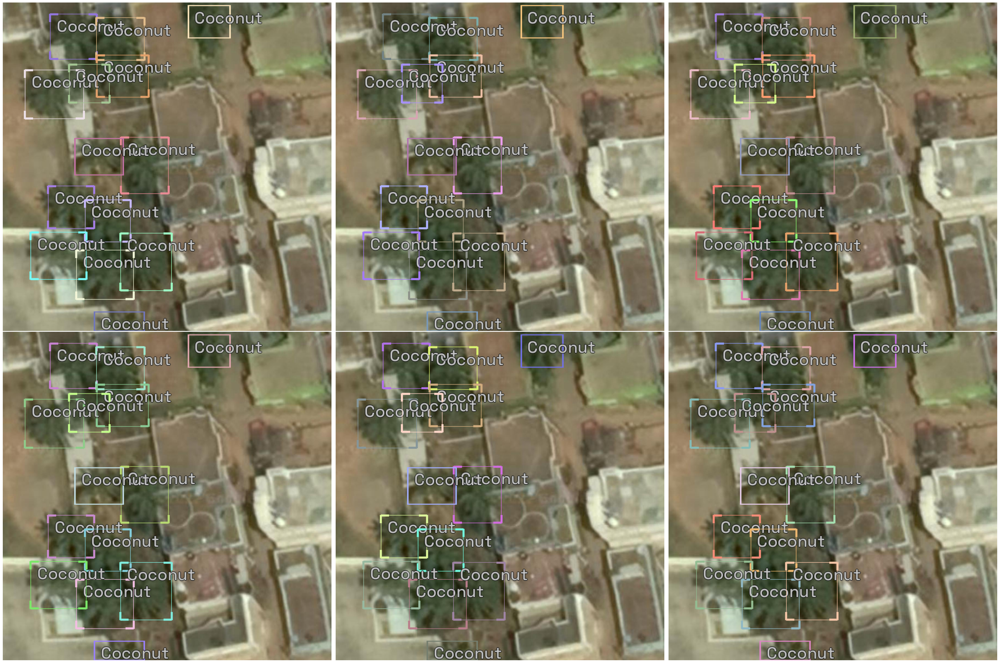

In [ ]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(6)]
show_samples(samples, ncols=3)

1,2,5,6,7,11-15

In [ ]:
# Just change the value of selection to try another model

selection = 1

extra_args = {}

if selection == 0:
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x

if selection == 1:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x
  # extra_args['cfg_options'] = { 
  #   'model.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 2:
  model_type = models.mmdet.faster_rcnn
  backbone = model_type.backbones.resnet101_fpn_2x
  # extra_args['cfg_options'] = { 
  #   'model.roi_head.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.roi_head.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 3:
  model_type = models.mmdet.ssd
  backbone = model_type.backbones.ssd300

if selection == 4:
  model_type = models.mmdet.yolox
  backbone = model_type.backbones.yolox_s_8x8

if selection == 5:
  model_type = models.mmdet.yolof
  backbone = model_type.backbones.yolof_r50_c5_8x8_1x_coco

if selection == 6:
  model_type = models.mmdet.detr #This can e tried as it works on small object
  backbone = model_type.backbones.r50_8x2_150e_coco

if selection == 7:
  model_type = models.mmdet.deformable_detr
  backbone = model_type.backbones.twostage_refine_r50_16x2_50e_coco

if selection == 8:
  model_type = models.mmdet.fsaf
  backbone = model_type.backbones.x101_64x4d_fpn_1x_coco

if selection == 9:
  model_type = models.mmdet.sabl
  backbone = model_type.backbones.r101_fpn_gn_2x_ms_640_800_coco

if selection == 10:
  model_type = models.mmdet.centripetalnet
  backbone = model_type.backbones.hourglass104_mstest_16x6_210e_coco

elif selection == 11:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 12:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 13: #Mobile Deployment
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 14: #Best as of now
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.swin_t_p4_w7_fpn_1x_coco

elif selection == 15: #2nd Best
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x  

model_type, backbone, extra_args

(<module 'icevision.models.mmdet.models.retinanet' from '/usr/local/lib/python3.7/dist-packages/icevision/models/mmdet/models/retinanet/__init__.py'>,
 {})

In [ ]:
# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args)

2022-11-05 18:10:32,976 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2022-11-05 18:10:32,978 - mmcv - INFO - load model from: torchvision://resnet50
2022-11-05 18:10:32,980 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
2022-11-05 18:10:33,081 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2022-11-05 18:10:33,100 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2022-11-05 18:10:33,155 - mmcv - INFO - initialize RetinaHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'retina_cls', 'std': 0.01, 'bias_prob': 0.01}}
2022-11-05 18:10:33,193 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load from torchvision://resnet50 
 
2022-11-05 18:10:33,194 - mmcv - INFO

load checkpoint from local path: checkpoints/retinanet/retinanet_r50_fpn_1x_coco_20200130-c2398f9e.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([9, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([9]).


In [ ]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=4, num_workers=8, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=4, num_workers=8, shuffle=False)

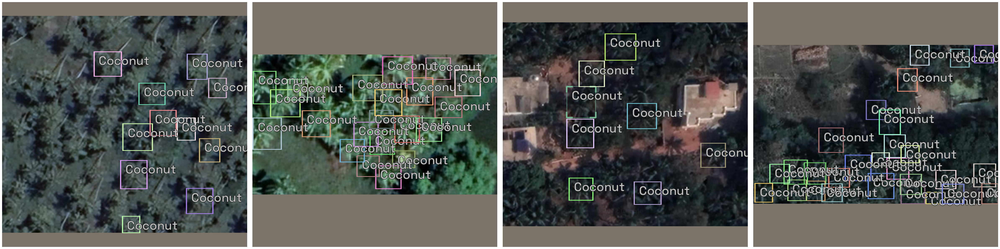

In [ ]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox, print_summary=True)]

In [ ]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics, cbs=[SaveModelCallback(fname='/content/cheque_yolov5_medium')])

In [ ]:
learn.save('test')

Path('models/test.pth')

In [ ]:
import time
begin = time.time()
  
learn.fine_tune(150, 1e-3, freeze_epochs=15)
end = time.time()

epoch,train_loss,valid_loss,COCOMetric,time
0,0.955921,0.842338,0.028399,00:26
1,0.811784,0.712055,0.092887,00:17
2,0.750112,0.680864,0.200585,00:16
3,0.696362,0.647788,0.238339,00:17
4,0.684590,0.697474,0.133769,00:16
5,0.647333,0.618635,0.212878,00:16
6,0.697916,0.620643,0.239828,00:16
7,0.626450,0.588937,0.262539,00:16
8,0.598463,0.622736,0.259522,00:16
9,0.586404,0.571800,0.269358,00:16


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.028
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.087
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.011
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.035
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.073
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.008
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.041
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.172
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.196
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.087
Better model found at epoch 0 with valid

epoch,train_loss,valid_loss,COCOMetric,time
0,0.515503,0.541563,0.301598,00:20
1,0.477645,0.546626,0.291305,00:17
2,0.439829,0.552938,0.291236,00:17
3,0.413304,0.556824,0.296418,00:17
4,0.383124,0.582683,0.291538,00:17
5,0.353014,0.605054,0.279473,00:16
6,0.318950,0.622713,0.282535,00:17
7,0.291429,0.659612,0.269531,00:16
8,0.262453,0.696761,0.270371,00:16
9,0.245039,0.729573,0.266149,00:17


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.302
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.712
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.168
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.073
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.331
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.480
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.174
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.429
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.177
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.467
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.567
Better model found at epoch 0 with valid

In [ ]:
print(f"Total runtime of the program is {end - begin}")

Total runtime of the program is 2587.3629882335663


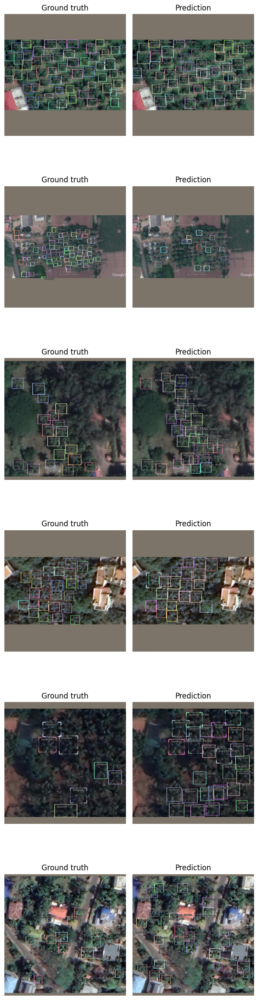

In [ ]:
model_type.show_results(model, valid_ds, detection_threshold=.4)

In [ ]:
!unzip -q "/content/test_VOC.zip"

unzip:  cannot find or open /content/test_VOC.zip, /content/test_VOC.zip.zip or /content/test_VOC.zip.ZIP.


In [ ]:
!rm -r "/content/__MACOSX"

rm: cannot remove '/content/__MACOSX': No such file or directory


In [ ]:
os.listdir('/content/test_VOC')

['000382_jpg.rf.22c971940a302e354e86587e8ad3b5cb.xml',
 '000416_jpg.rf.27d8582d8558c5af2a276be6ad177a48.jpg',
 '000140_jpg.rf.a75461b5ba9d3345f094f5fb038decca.jpg',
 '000041_jpg.rf.0f07c2bdf01c3a660f936ca4af83c3fa.xml',
 '000384_jpg.rf.19c8f4391e6690c04b88d43d43660983.jpg',
 '000025_jpg.rf.e3908c114be5abdd0e514cbdc8cd0f30.jpg',
 '000149_jpg.rf.109cfda7c9175678cac05429dcfd1c2e.xml',
 '000014_jpg.rf.0dfa74c14f049652e0c95ca93bccb4c7.jpg',
 '000134_jpg.rf.afbeeaaf7e43d6aa16cb7b21a7ce69eb.xml',
 '000045_jpg.rf.cc328676db4873ed6b0287608f4f8912.xml',
 '000350_jpg.rf.a36f63dd42e6733e5f2fda0511dfff16.xml',
 '000461_jpg.rf.1549b365bfd6190472f38a677bdc5aa5.xml',
 '000380_jpg.rf.8f407418d2e5ab3de539735119ef2525.jpg',
 '000367_jpg.rf.cab136956cb7b20bf26d87305d488975.xml',
 '000458_jpg.rf.a788fa9ec7119eec6de88dac136e078f.jpg',
 '000438_jpg.rf.b2c93bb40149e8a6f8a852ea92649676.jpg',
 '000116_jpg.rf.8bcf4208de4552c2566068b59e85b2d6.xml',
 '000010_jpg.rf.948c33366e83388cdfce8ce42a776cea.xml',
 '000209_j

In [ ]:
data_dir = "/content/test_VOC"
spliter =RandomSplitter([0, 0, 1.0], seed=42)
parser = parsers.VOCBBoxParser(annotations_dir=data_dir, images_dir=data_dir)
_,_,test_records = parser.parse(spliter)
image_size = 640

test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])
test_ds = Dataset(test_records, test_tfms)

  0%|          | 0/501 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/501 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 000000_jpg.rf.d28af308cd3ea352827598e04f2efcef) - Clipping bbox ymax from 225 to image height 224 (Before: <BBox (xmin:1, ymin:169, xmax:73, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000001_jpg.rf.a59008af1bc9d8d06f9f797f537879ff) - Clipping bbox xmax from 225 to image width 224 (Before: <BBox (xmin:167, ymin:55, xmax:225, ymax:145)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) - Clipping bbox xmax from 225 to image width 224 (Before: <BBox (xmin:142, ymin:157, xmax:225, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) - Clipping bbox ymax from 225 to image height 224 (Before: <BBox (xmin:142, ymin:157, xmax:224, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) 

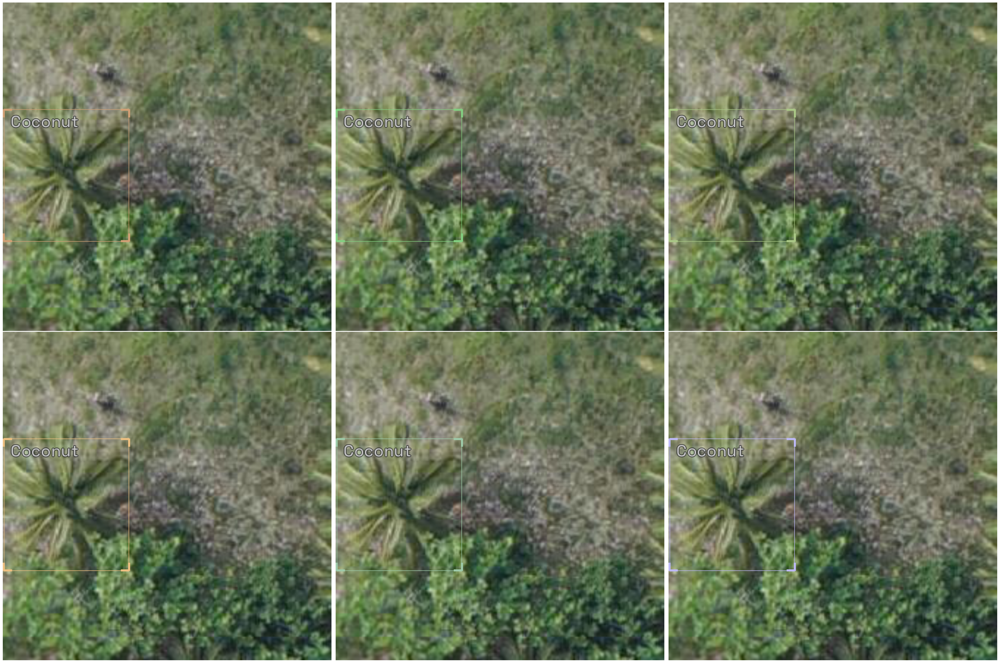

In [ ]:
# Show an element of the train_ds with augmentation transformations applied
samples = [test_ds[0] for _ in range(6)]
show_samples(samples, ncols=3)

In [ ]:
test_dl = model_type.valid_dl(test_ds, batch_size=4, num_workers=8, shuffle=False)

# Test Accuracy

In [ ]:
learn.validate(dl=test_dl) 

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.011
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.065
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.012
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.023
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.043
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.058
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.058
Better model found at epoch 0 with v

(#2) [1.7262539863586426,0.01083587740717417]

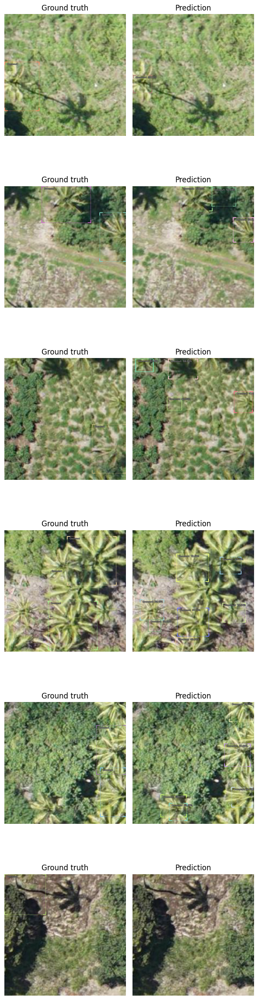

In [ ]:
model_type.show_results(model, test_ds, detection_threshold=.4)

# Train Accuracy

In [ ]:
learn.validate()

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.302
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.712
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.168
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.073
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.331
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.480
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.174
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.429
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.177
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.467
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.567
Better model found at epoch 0 with valid

(#2) [0.5415633320808411,0.30159797526428805]

# Change model No in model_no.zip

In [ ]:
import os

path = "/content/drive/MyDrive/Model_1"
os.mkdir(path)

In [ ]:
# change path

In [ ]:
!cp /content/models/test.pth /content/drive/MyDrive/Model_1

# Saving Metadata

In [ ]:
from icevision.all import *
import warnings
warnings.filterwarnings('ignore')
from fastai.callback.tracker import SaveModelCallback
import glob, os, shutil

In [ ]:
from icevision.models import *

In [ ]:
# How to save a model and its metadata
checkpoint_path = '/content/full_model1.pth'
save_icevision_checkpoint(model, 
                        model_name='mmdet.retinanet', 
                        backbone_name='resnet50_fpn_1x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

In [ ]:
!cp /content/full_model1.pth /content/drive/MyDrive/Model_1